**NOTE** : requires local installation of the [YOLOv5](https://github.com/ultralytics/yolov5) repo.  
The yolo CLI is used, not Python

# YOLOv5

**YOLO** You Only Look Once, is a one stage detector that have been proposed for the purpose of realtime fast detection.

YOLOv5 uses a single convolutional neural network to simultaneously predict bounding boxes and class probabilities for objects in an image. It divides the image into a grid and is responsible for detecting objects that fall into each grid cell. Each grid cell predicts multiple bounding boxes and confidence scores for those boxes.

YOLOv5 uses anchor boxes to handle a wider range of object sizes and aspect ratios, and it uses batch normalization and a multi-scale training strategy to improve accuracy and stability.

# -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
## Training setup

### 1. GPU memory usage
Run this code lines to check CUDA and GPU memory availabilty

In [3]:
!nvidia-smi

Mon Jan 15 11:17:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A6000               On  | 00000000:19:00.0 Off |                  Off |
| 30%   40C    P8              24W / 300W |  47141MiB / 49140MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [18]:
# Check CUDA compiler
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


## Start training

Run the folloying command to run the training process

In [ ]:
!python3 algorithms/yolov5/train.py --img 512 --cfg yolov5x.yaml --hyp algorithms/yolov5/data/hyps/hyp.scratch-low.yaml --batch 32 --epochs 500 --data data/HRPlanesv2/dataset.yaml --weights yolov5x.pt --workers 8 --name yolov5 --device 2 

### Wait until the training finishes
if the training takes too long you can use in the terminal the command:

```nohup python3 algorithms/yolov5/train.py --img 512 --cfg yolov5x.yaml --hyp algorithms/yolov5/data/hyps/hyp.scratch-low.yaml --batch 20 --epochs 500 --data data/HRPlanesv2/dataset.yaml --weights yolov5x.pt --workers 8 --name yolov5 --device 2 > yolov5_hrplanesv2.log &```

Per epoch results yill be stored in yolov5_hrplanesv2.log

# Inference

To run the inference, `detect.py` from YOLOv5 repository has been used. Run the folloying command.

In [2]:
!python3 algorithms/yolov5/detect.py --weights output_tensor/yolov5/weights/best.pt --source inference_test/unseen  --save-txt --save-conf  

detect: weights=['output_tensor/yolov5/weights/best.pt'], source=inference_test/unseen, data=algorithms/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=algorithms/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-272-gde64179 Python-3.8.18 torch-2.0.1 CUDA:0 (NVIDIA RTX A6000, 48677MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
image 1/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unseen/003_set2.jpg: 384x640 10 Aircrafts, 54.5ms
image 2/10 /home/safouane/Downloads/FlightScope_Bench/inference_test/unseen/022f91f0-1434-401f-a11b-e315b7068100.jpg: 640x640 25 Aircrafts, 12.1ms
image 3/10 /home/

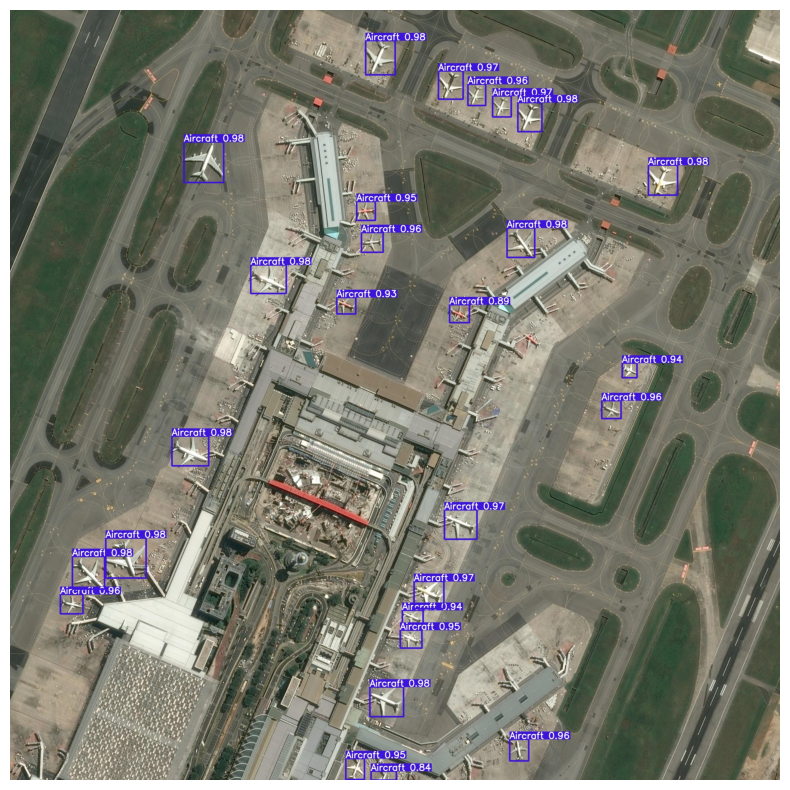

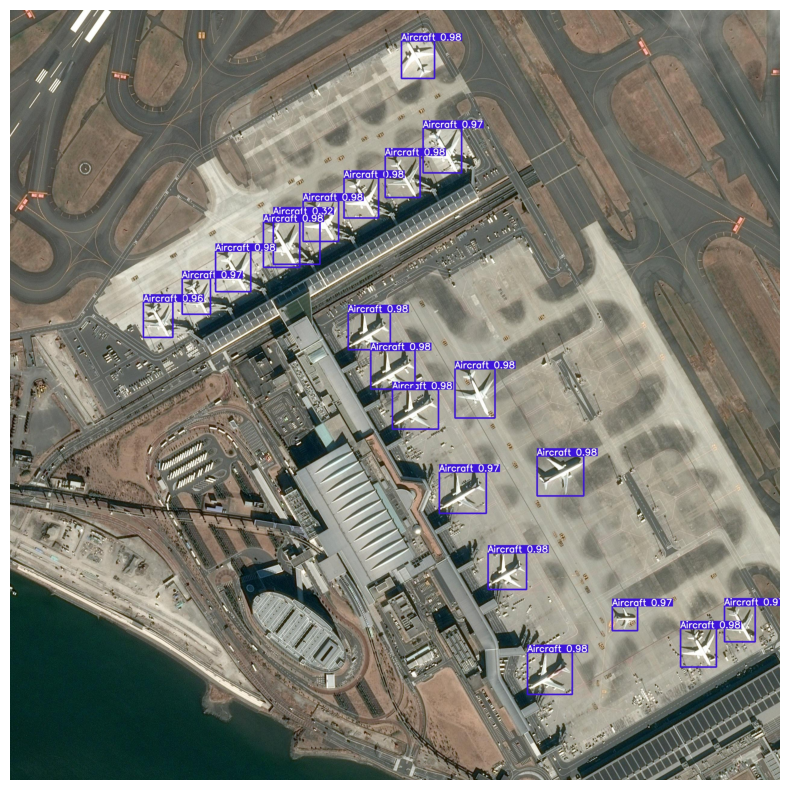

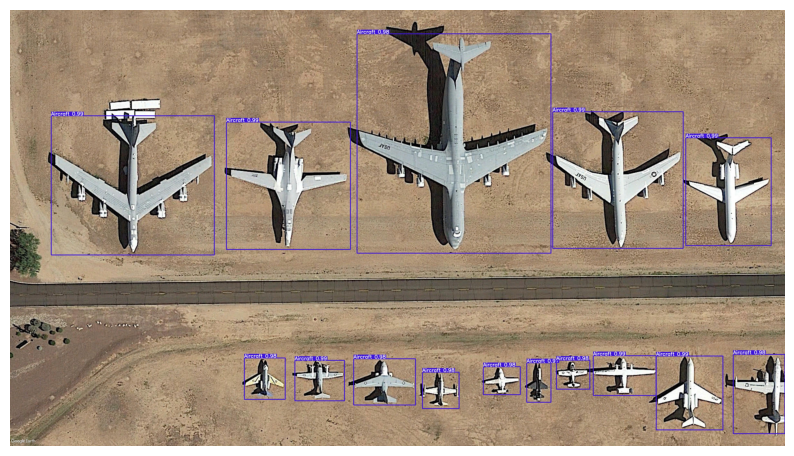

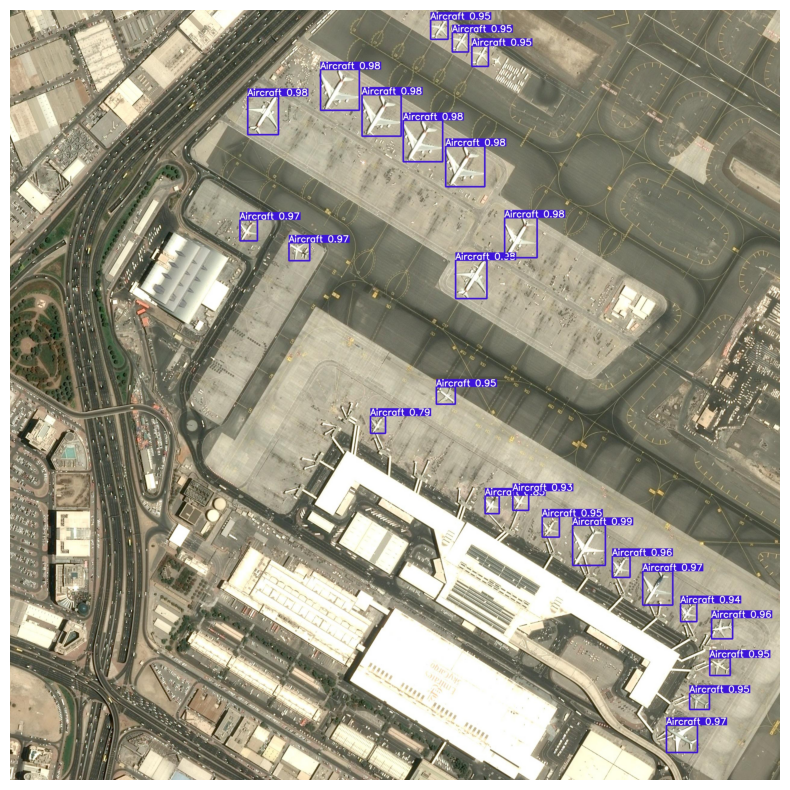

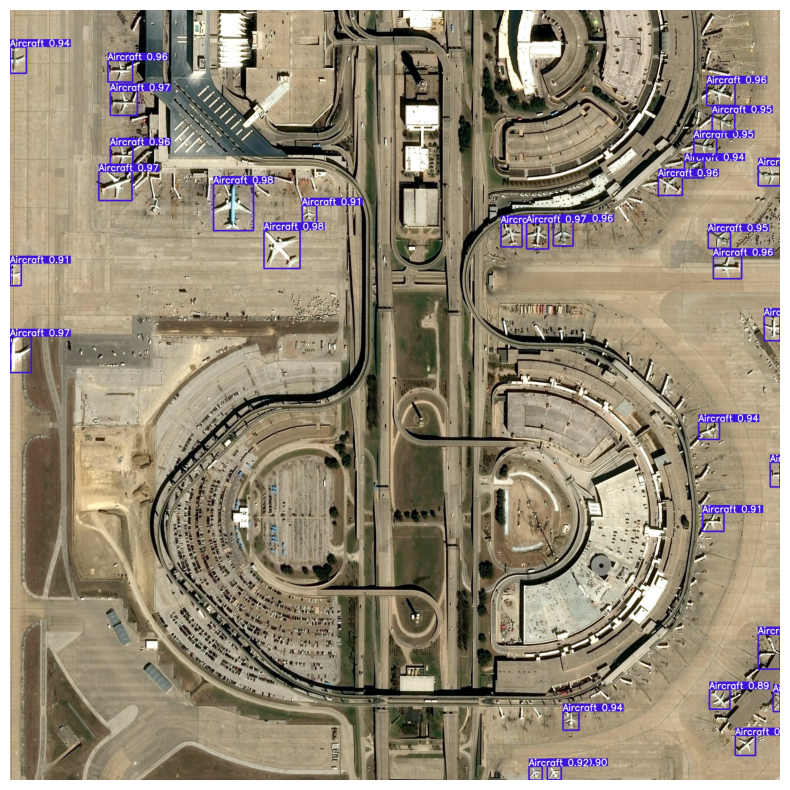

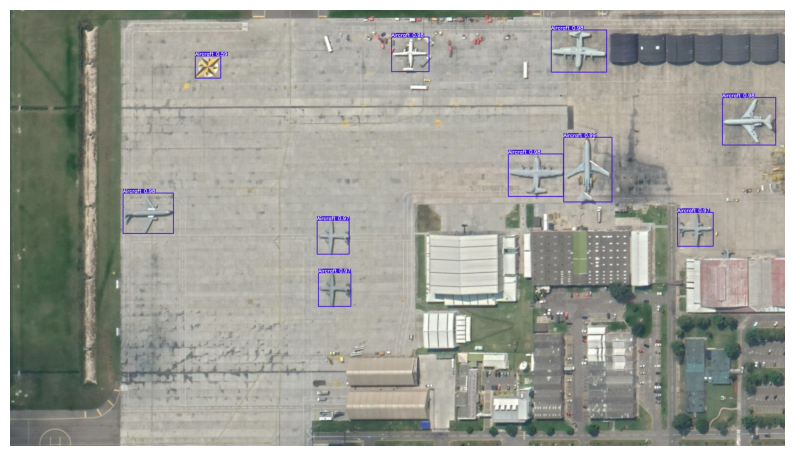

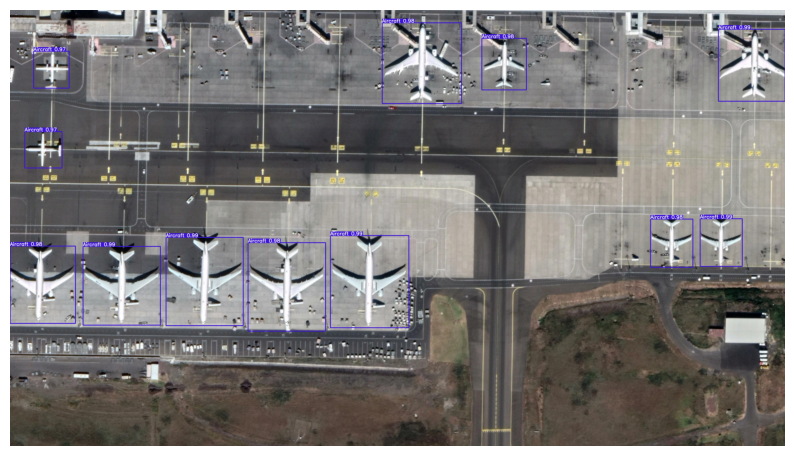

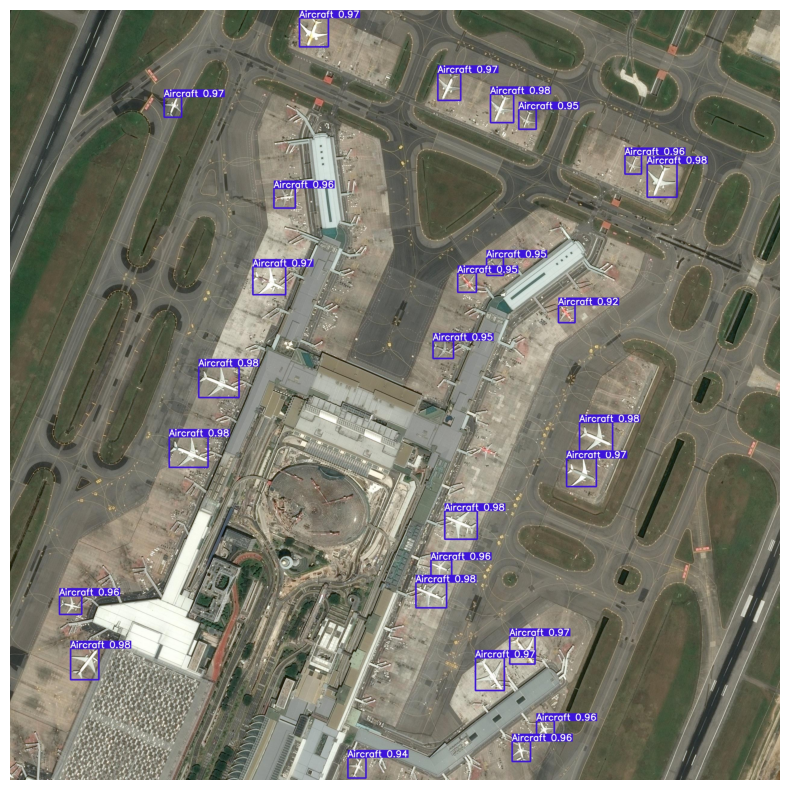

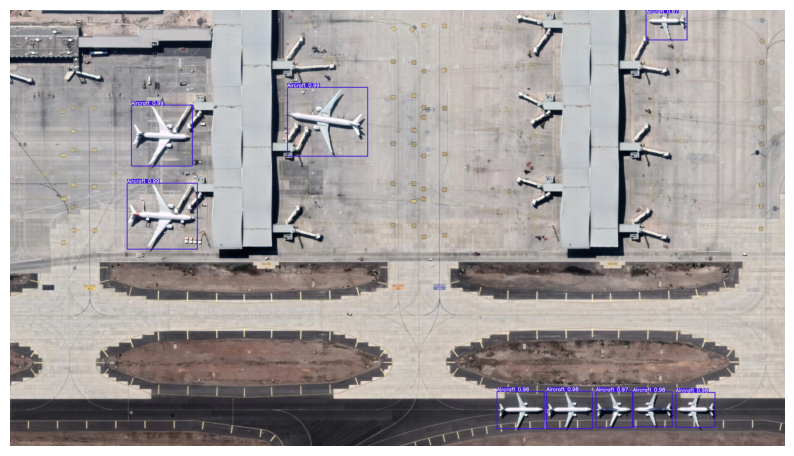

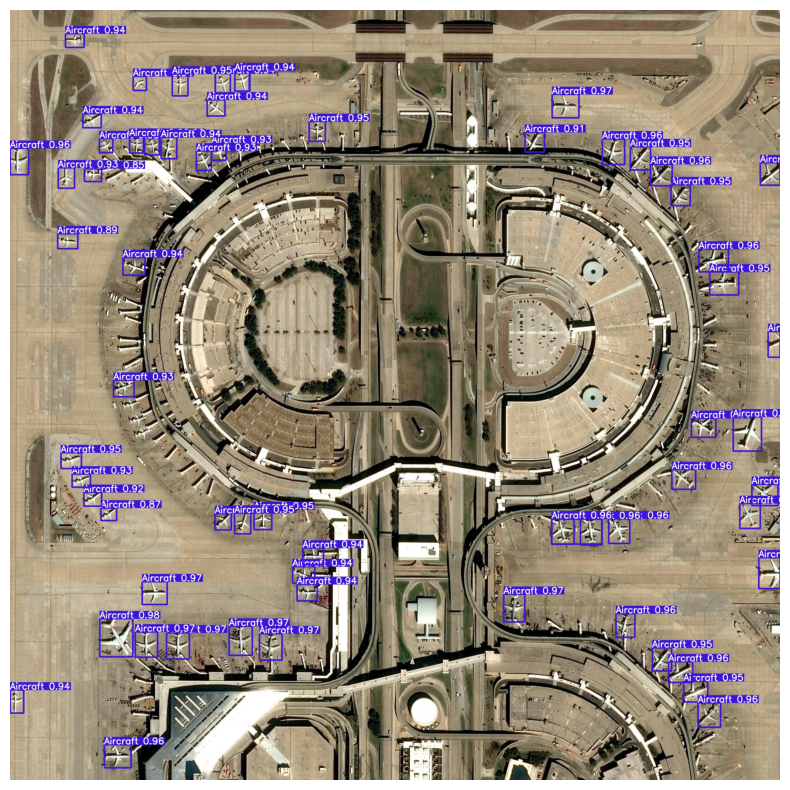

In [3]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the directory containing the jpg images
path_to_images = './inference_test/results/yolov5_inference/vis'

# Iterate over each file in the directory
for file in os.listdir(path_to_images):
    # Check if the file is a jpg image
    if file.endswith('.jpg'):
        # Open the image using PIL
        img = Image.open(os.path.join(path_to_images, file))

        # Convert the image to an RGB format that matplotlib can understand
        img_rgb = img.convert('RGB')

        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.show()

In [10]:
!python3 algorithms/yolov5/detect.py -h

usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE]
                 [--data DATA] [--imgsz IMGSZ [IMGSZ ...]]
                 [--conf-thres CONF_THRES] [--iou-thres IOU_THRES]
                 [--max-det MAX_DET] [--device DEVICE] [--view-img]
                 [--save-txt] [--save-csv] [--save-conf] [--save-crop]
                 [--nosave] [--classes CLASSES [CLASSES ...]] [--agnostic-nms]
                 [--augment] [--visualize] [--update] [--project PROJECT]
                 [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS]
                 [--hide-labels] [--hide-conf] [--half] [--dnn]
                 [--vid-stride VID_STRIDE]

optional arguments:
  -h, --help            show this help message and exit
  --weights WEIGHTS [WEIGHTS ...]
                        model path or triton URL
  --source SOURCE       file/dir/URL/glob/screen/0(webcam)
  --data DATA           (optional) dataset.yaml path
  --imgsz IMGSZ [IMGSZ ...], --img IMGSZ [IMGSZ ...

## 3. Video inference

In [17]:
!python3 algorithms/yolov5/detect.py --weights output_tensor/yolov5/weights/best.pt --source inference_test/videos/Barcelona_airport.mp4 --hide-conf --hide-labels --line-thickness 2

detect: weights=['output_tensor/yolov5/weights/best.pt'], source=inference_test/videos/Barcelona_airport.mp4, data=algorithms/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=algorithms/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=2, hide_labels=True, hide_conf=True, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-272-gde64179 Python-3.8.18 torch-2.0.1 CUDA:0 (NVIDIA RTX A6000, 48677MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
video 1/1 (1/449) /home/safouane/Downloads/FlightScope_Bench/inference_test/videos/Barcelona_airport.mp4: 384x640 25 Aircrafts, 60.6ms
video 1/1 (2/449) /home/safouane/Downloads/FlightScope_Bench/inference_test/videos/Barcelona_airport.mp4: 384x640 25 Aircrafts